# Import dependencies

In [23]:
import numpy as np
import pandas as pd

from tqdm import tqdm

import tensorflow as tf
import tensorflow_addons as tfa

from transformers import BertConfig, BertModel, RobertaModel
from transformers import RobertaTokenizer, RobertaConfig, TFRobertaModel

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Load Model

In [2]:
# load tokenizer
tokenizer = RobertaTokenizer.from_pretrained("./codebert-base")

In [3]:
# load model
model = TFRobertaModel.from_pretrained("./codebert-base/")

All model checkpoint layers were used when initializing TFRobertaModel.

All the layers of TFRobertaModel were initialized from the model checkpoint at ./codebert-base/.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFRobertaModel for predictions without further training.


In [4]:
le_tokens = tokenizer.tokenize("(λx.(((λy.y) (λz.(λa.(λb.a)))) (λc.c)))")
tokens = [tokenizer.cls_token] + le_tokens + [tokenizer.eos_token]
tokens_ids = tokenizer.convert_tokens_to_ids(tokens)

tokens_ids = tf.constant(tokens_ids, dtype=tf.int32)
tokens_ids = tf.expand_dims(tokens_ids, axis=0)

context_embeddings = model(tokens_ids)

context_embeddings[0]

<tf.Tensor: shape=(1, 30, 768), dtype=float32, numpy=
array([[[-0.06790983,  0.16003864, -0.08113418, ..., -0.16317725,
         -0.47541702,  0.40393323],
        [-0.49890435,  0.0894645 , -0.03886295, ...,  0.36657208,
         -0.54184794,  0.2876726 ],
        [-0.37728477, -0.04498858,  0.25325608, ..., -0.7006783 ,
         -0.53978413,  0.34478602],
        ...,
        [-0.42253712, -0.1807437 ,  0.18520138, ..., -0.792792  ,
         -0.53018826,  0.37685454],
        [-0.28178942, -0.02010319, -0.01168358, ..., -0.11536087,
         -0.4393902 ,  0.8512744 ],
        [-0.06779005,  0.16013034, -0.08106291, ..., -0.16288999,
         -0.47560245,  0.4040114 ]]], dtype=float32)>

In [5]:
np.array(context_embeddings[0])[0]

array([[-0.06790983,  0.16003864, -0.08113418, ..., -0.16317725,
        -0.47541702,  0.40393323],
       [-0.49890435,  0.0894645 , -0.03886295, ...,  0.36657208,
        -0.54184794,  0.2876726 ],
       [-0.37728477, -0.04498858,  0.25325608, ..., -0.7006783 ,
        -0.53978413,  0.34478602],
       ...,
       [-0.42253712, -0.1807437 ,  0.18520138, ..., -0.792792  ,
        -0.53018826,  0.37685454],
       [-0.28178942, -0.02010319, -0.01168358, ..., -0.11536087,
        -0.4393902 ,  0.8512744 ],
       [-0.06779005,  0.16013034, -0.08106291, ..., -0.16288999,
        -0.47560245,  0.4040114 ]], dtype=float32)

In [6]:
model.summary()

Model: "tf_roberta_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 roberta (TFRobertaMainLayer  multiple                 124645632 
 )                                                               
                                                                 
Total params: 124,645,632
Trainable params: 124,645,632
Non-trainable params: 0
_________________________________________________________________


# Load Data

In [7]:
# prepare 4k terms:
all_data = pd.read_csv("../tests_17_ann_and_terms/article_v2_2_term_var_to_best_strategy/prepare_data/data_steps/steps_vars_term_str_train.csv", delimiter=',')

# leave only unique terms
print(f"Count all terms: {len(all_data)}")
print(f"max RI steps count: {max(all_data['RI_steps_num'])}")
print(f"max LO steps count: {max(all_data['LO_steps_num'])}")

terms_data = all_data["vars_terms"].tolist()

Count all terms: 45038
max RI steps count: 1000
max LO steps count: 1000


In [ ]:
data_vectorized_pd = pd.DataFrame()

for term_inx, term_str in enumerate(tqdm(terms_data)):
    try:
        le_tokens = tokenizer.tokenize(term_str)
        tokens = [tokenizer.cls_token] + le_tokens + [tokenizer.eos_token]
        tokens_ids = tokenizer.convert_tokens_to_ids(tokens)
        
        tokens_ids = tf.constant(tokens_ids, dtype=tf.int32)
        tokens_ids = tf.expand_dims(tokens_ids, axis=0)
        
        context_embeddings = model(tokens_ids)
        data_pd = pd.DataFrame(np.array(context_embeddings[0])[0])
        
        data_vectorized_pd = pd.concat([
            data_vectorized_pd, 
            pd.DataFrame({param_no: [mean_embed, ] for param_no, mean_embed in enumerate(data_pd.mean())})
        ])
    except Exception as exception:
        data_vectorized_pd = pd.concat([
            data_vectorized_pd, 
            pd.DataFrame({param_no: [None, ] for param_no, mean_embed in enumerate(range(768))})
        ])

100%|██████████| 45038/45038 [8:53:43<00:00,  1.41it/s]    


In [9]:
data_vectorized_pd.head()

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,-0.287226,-0.031520,0.085640,0.208264,0.399464,-0.080951,0.159691,-0.006726,0.186925,0.229612,...,0.276129,-0.065026,-0.519624,0.708918,-0.290864,0.109553,0.718525,-0.212345,-0.535558,0.501471
0,-0.305958,-0.043362,0.104937,0.181395,0.389205,-0.098738,0.143828,-0.022075,0.207228,0.236077,...,0.260251,-0.066207,-0.518456,0.723922,-0.305164,0.130647,0.737372,-0.249239,-0.540049,0.532870
0,-0.312585,-0.032012,0.101622,0.227510,0.316002,-0.106138,0.123502,-0.054117,0.247700,0.265483,...,0.238262,-0.074563,-0.523109,0.741782,-0.361033,0.148564,0.778379,-0.265924,-0.521594,0.522245
0,-0.332100,0.048967,0.092309,0.192513,0.191973,0.033928,0.081028,0.027512,0.261570,0.222043,...,0.300012,-0.110882,-0.486940,0.651236,-0.380806,0.121643,0.673708,-0.237936,-0.462207,0.609783
0,-0.395399,-0.024738,0.163833,0.116456,0.201795,-0.024604,0.128866,0.031010,0.279496,0.283008,...,0.306592,-0.148440,-0.548664,0.669954,-0.311959,0.161161,0.666969,-0.362647,-0.543597,0.595123


In [10]:
data_vectorized_pd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45038 entries, 0 to 0
Columns: 768 entries, 0 to 767
dtypes: float64(768)
memory usage: 264.2 MB


In [11]:
len(data_vectorized_pd)

45038

In [12]:
data_vectorized_pd.to_csv(f"term_embeddings/vectorized_term_embeddings_40k.csv", index=False)

# VISUALIZE 

In [29]:
all_data = pd.read_csv("../tests_17_ann_and_terms/article_v2_2_term_var_to_best_strategy/prepare_data/data_steps/steps_vars_term_str_train.csv", delimiter=',')

# leave only unique terms
print(f"Count all terms: {len(all_data)}")

print(f"max RI steps count: {max(all_data['RI_steps_num'])}")
print(f"max LO steps count: {max(all_data['LO_steps_num'])}")

# RI == LO -> 0
# RI > LO -> 1
# RI < LO -> 2
class_RI_LO = ["RI = LO" if los == ris else "RI < LO" if ris < los else "LO < RI" for los, ris in zip(all_data["LO_steps_num"].tolist(), all_data["RI_steps_num"].tolist())]

print(f"Count terms data samples: {len(class_RI_LO)}")

Count all terms: 45038
max RI steps count: 1000
max LO steps count: 1000
Count terms data samples: 45038


In [30]:
data_vectorized_pd["class"] = class_RI_LO

In [31]:
vec_embeddings_data = data_vectorized_pd.dropna()
vec_embeddings_data = vec_embeddings_data.drop_duplicates()
len(vec_embeddings_data)

43448

In [32]:
class_RI_LO = vec_embeddings_data["class"]
vec_embeddings_data = vec_embeddings_data.drop(["class"], axis=1)

# Visualize with PCA

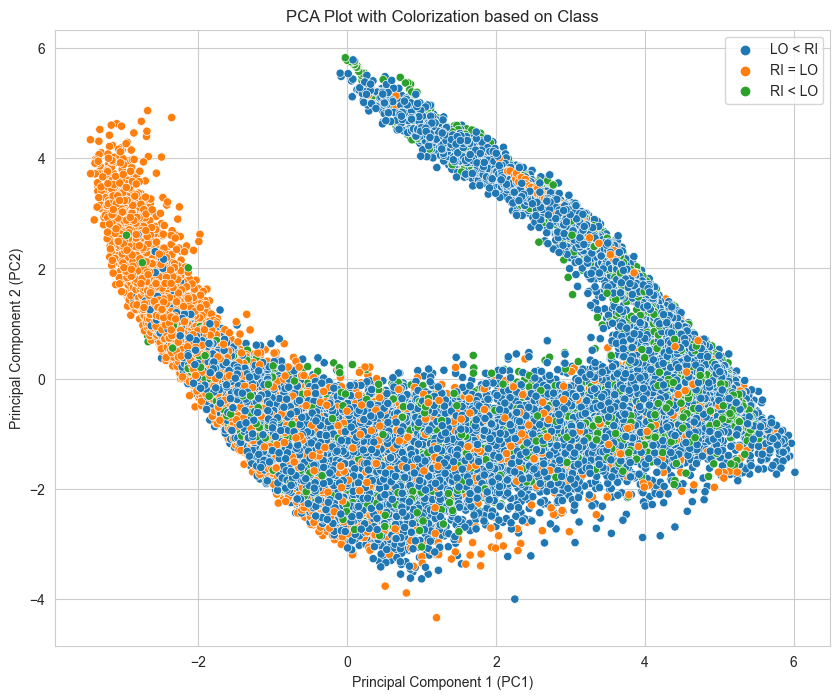

In [35]:
pca = PCA(n_components=2)  # Set the number of components as needed
principal_components = pca.fit_transform(vec_embeddings_data)

pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['class'] = class_RI_LO.tolist()

# Plot the PCA results with colorization based on the 'class' column
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PC1', y='PC2', hue='class', data=pca_df,)
plt.title('PCA Plot with Colorization based on Class')
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 2 (PC2)')
plt.legend()
plt.show()

In [38]:
pca_3d = PCA(n_components=3)  # Set the number of components as needed
principal_components_3d = pca_3d.fit_transform(vec_embeddings_data)

pca_df_3d = pd.DataFrame(data=principal_components_3d, columns=['PC1', 'PC2', 'PC3'])
pca_df_3d['class'] = class_RI_LO.tolist()

fig = px.scatter_3d(
    pca_df_3d, x='PC1', y='PC2', z='PC3',
    color='class', title="PCA 3D Visualization",
)

fig.update_traces(marker=dict(size=2))

# Show the plot
fig.show()

# Visualize with t-SNE

C:\Users\voldo\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\voldo\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


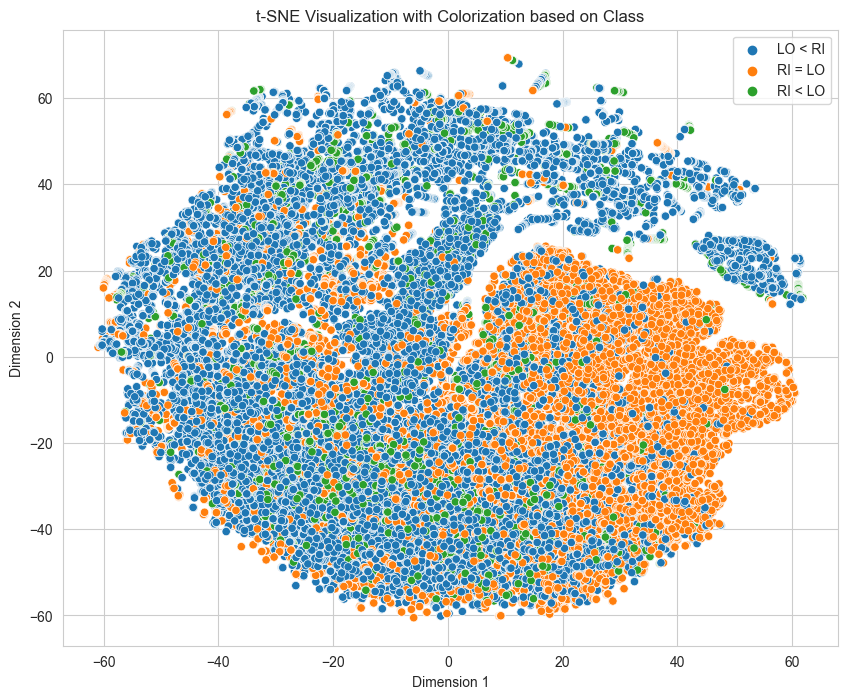

In [37]:
tsne = TSNE(n_components=2, random_state=42)
embedded_data = tsne.fit_transform(vec_embeddings_data)

tsne_df = pd.DataFrame(data=embedded_data, columns=['Dimension 1', 'Dimension 2'])
tsne_df['class'] = class_RI_LO.tolist()

# Plot the PCA results with colorization based on the 'class' column
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='class', data=tsne_df,)
plt.title('t-SNE Visualization with Colorization based on Class')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.show()

In [39]:
tsne_3d = TSNE(n_components=3, random_state=42)
embedded_data_3d = tsne_3d.fit_transform(vec_embeddings_data)

tsne_df_3d = pd.DataFrame(data=embedded_data_3d, columns=["Dim 1", "Dim 2", "Dim 3"])
tsne_df_3d['class'] = class_RI_LO.tolist()

fig = px.scatter_3d(
    tsne_df_3d, x='Dim 1', y='Dim 2', z='Dim 3',
    color='class', title="t-SNE 3D Visualization",
)

fig.update_traces(marker=dict(size=2))

# Show the plot
fig.show()

C:\Users\voldo\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\voldo\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

